In [13]:
import sys
!{sys.executable} -m pip install uniface[cpu]
import cv2
import urllib.request # Import for downloading image

from uniface import SCRFD, FaceMesh

# Initialize detector and Face Mesh
detector = SCRFD()
mesher = FaceMesh()

# Define URL for a sample image and local filename
# Using a publicly accessible image URL that is directly downloadable and valid
image_url = 'https://upload.wikimedia.org/wikipedia/commons/8/8d/President_Barack_Obama.jpg'
image_filename = 'sample_image.png'

# Download the image with User-Agent header to bypass potential 403 Forbidden
try:
    opener = urllib.request.build_opener()
    opener.addheaders = [('User-agent', 'Mozilla/5.0')]
    urllib.request.install_opener(opener)
    urllib.request.urlretrieve(image_url, image_filename)
    print(f"Downloaded {image_filename} from {image_url}")
except Exception as e:
    raise RuntimeError(f"Could not download sample image: {e}")

# Load the downloaded image
image = cv2.imread(image_filename)

# Check if image was loaded successfully
if image is None:
    raise ValueError("Could not load the downloaded image. Please check the image file path and content.")

# Detect faces
faces = detector.detect(image)

# Extract Face Mesh landmarks
results = mesher.predict(image, faces)

# Get the first face
if results:
    result = results[0]

    print("Landmarks:", result.landmarks.shape)  # (468, 3)
    print("2D Points:", result.points_2d.shape)  # (468, 2)
    print("Face Score:", result.score)
else:
    print("No faces detected in the image.")

Downloaded sample_image.png from https://upload.wikimedia.org/wikipedia/commons/8/8d/President_Barack_Obama.jpg
Landmarks: (468, 3)
2D Points: (468, 2)
Face Score: 1.0


In [9]:
import matplotlib.pyplot as plt

def draw_landmarks(image, landmarks_2d):
    """Draws 2D landmarks on an image."""
    # Convert image from BGR to RGB for matplotlib display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.scatter(landmarks_2d[:, 0], landmarks_2d[:, 1], s=5, c='red', alpha=0.7)
    plt.title('Detected Face Mesh Landmarks')
    plt.axis('off')
    plt.show()


In [10]:
# Check if faces were detected and results are available
if 'result' in locals() and result:
    draw_landmarks(image, result.points_2d)
else:
    print("No face detected or landmarks not available for visualization.")

No face detected or landmarks not available for visualization.


The visualization above shows the image with the detected face mesh landmarks overlaid as red dots. Each dot represents a 2D point on the face.

# **👁️ 478-Point Model with Iris Detection**

# The V2_478 model adds 10 iris landmarks to the standard 468-point mesh

In [14]:
from uniface import SCRFD, FaceMesh
from uniface.constants import FaceMeshWeights

detector = SCRFD()
mesher = FaceMesh(
    model_name=FaceMeshWeights.V2_478
)

faces = detector.detect(image)
results = mesher.predict(image, faces)

if results:
    result = results[0]

    print(result.landmarks.shape)  # (478, 3)

Attempt 1/3: 100%|██████████| 4.64M/4.64M [00:00<00:00, 20.7MB/s]


(478, 3)


# 🔍 Access the Iris Points

In [19]:
# جميع نقاط الـ Face Mesh
print("Shape:", result.landmarks.shape)

# أول 468 نقطة
mesh_points = result.landmarks[:468]

# آخر 10 نقاط الخاصة بالقزحية
iris_points = result.landmarks[468:]

print("Mesh:", mesh_points.shape)
print("Iris:", iris_points.shape)

Shape: (478, 3)
Mesh: (468, 3)
Iris: (10, 3)


In [20]:
# أول 5 نقاط = قزحية
left_iris = iris_points[:5]

# آخر 5 نقاط = القزحية الأخرى
right_iris = iris_points[5:]

print("Left iris:", left_iris.shape)
print("Right iris:", right_iris.shape)

Left iris: (5, 3)
Right iris: (5, 3)


In [21]:
print(result.landmarks.shape)
print(result.landmarks[468:])

(478, 3)
[[1.1859138e+03 5.7620886e+02 1.7450392e+00]
 [1.2144688e+03 5.7569452e+02 1.7504628e+00]
 [1.1854275e+03 5.5028473e+02 1.7715304e+00]
 [1.1566193e+03 5.7673700e+02 1.7546868e+00]
 [1.1860203e+03 6.0280200e+02 1.7419782e+00]
 [1.4812950e+03 5.7498206e+02 9.8453134e-01]
 [1.5104790e+03 5.7476056e+02 9.8908478e-01]
 [1.4813994e+03 5.4909503e+02 9.8122257e-01]
 [1.4511638e+03 5.7441534e+02 9.4525391e-01]
 [1.4799204e+03 6.0058453e+02 9.4697589e-01]]


# 📐 3D Output

# The landmarks are returned as:

In [22]:
result.landmarks

array([[ 1.3338925e+03,  8.4082202e+02, -8.9327873e+01],
       [ 1.3320242e+03,  7.6339862e+02, -1.7115887e+02],
       [ 1.3332378e+03,  7.8708972e+02, -9.8540482e+01],
       ...,
       [ 1.4813994e+03,  5.4909503e+02,  9.8122257e-01],
       [ 1.4511638e+03,  5.7441534e+02,  9.4525391e-01],
       [ 1.4799204e+03,  6.0058453e+02,  9.4697589e-01]], dtype=float32)

x → horizontal position
y → vertical position
z → relative depth

# If you only need 2D coordinates:


In [23]:
points_2d = result.points_2d

# 🎨 Visualization

In [24]:
from uniface.draw import draw_mesh

# Partial mesh — recommended for real-time applications
draw_mesh(
    image,
    result.landmarks,
    mode="partial"
)

# Full mesh
draw_mesh(
    image,
    result.landmarks,
    mode="full"
)

# Points only
draw_mesh(
    image,
    result.landmarks,
    mode="points"
)

array([[[ 32,  34,  98],
        [ 30,  33,  94],
        [ 27,  30,  91],
        ...,
        [ 89,  94, 193],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 32,  34,  98],
        [ 29,  32,  93],
        [ 27,  30,  91],
        ...,
        [ 88,  93, 192],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 31,  33,  97],
        [ 29,  32,  93],
        [ 26,  29,  90],
        ...,
        [ 87,  92, 191],
        [ 90,  95, 194],
        [ 90,  95, 194]],

       ...,

       [[ 34,  74, 122],
        [ 34,  74, 122],
        [ 35,  75, 123],
        ...,
        [ 11,  50,  89],
        [ 15,  51,  91],
        [ 14,  49,  89]],

       [[ 33,  71, 119],
        [ 33,  71, 119],
        [ 34,  72, 120],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]],

       [[ 31,  67, 115],
        [ 31,  67, 115],
        [ 32,  68, 116],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]]

# 🎯 Using Face Bounding Boxes Directly

You can use Face Mesh without running a detector first:

In [26]:
from uniface import SCRFD, FaceMesh
from uniface.constants import FaceMeshWeights

# إنشاء النماذج
detector = SCRFD()
mesher = FaceMesh(
    model_name=FaceMeshWeights.V2_478
)

# اكتشاف الوجوه
faces = detector.detect(image)

print("Number of faces:", len(faces))

# إنشاء Face Mesh
results = mesher.predict(image, faces)

print("Number of results:", len(results))

if results:
    result = results[0]

    print("Landmarks:", result.landmarks.shape)

Number of faces: 1
Number of results: 1
Landmarks: (478, 3)


In [27]:
x1 = 100
y1 = 80
x2 = 400
y2 = 450

results = mesher.predict(
    image,
    bboxes=[[x1, y1, x2, y2]]
)

In [30]:
import os

for file in os.listdir():
    print(file)

.config
sample_image.png
sample_data


In [31]:
import cv2

from uniface import SCRFD, FaceMesh
from uniface.constants import FaceMeshWeights

# =========================
# 1. Load image
# =========================

image_path = "sample_image.png"

image = cv2.imread(image_path)

if image is None:
    raise FileNotFoundError(
        f"Could not load image: {image_path}"
    )

print("✅ Image loaded:", image.shape)


# =========================
# 2. Face Detection
# =========================

detector = SCRFD()

faces = detector.detect(image)

print("👤 Faces detected:", len(faces))


# =========================
# 3. Face Mesh
# =========================

mesher = FaceMesh(
    model_name=FaceMeshWeights.V2_478
)

results = mesher.predict(
    image,
    faces
)


# =========================
# 4. Results
# =========================

if results:
    result = results[0]

    print("✅ Face Mesh:", result.landmarks.shape)
else:
    print("❌ No Face Mesh result")

✅ Image loaded: (3356, 2687, 3)
👤 Faces detected: 1
✅ Face Mesh: (478, 3)


In [32]:
from uniface.draw import draw_mesh
import cv2

# رسم الـ Face Mesh
output = image.copy()

draw_mesh(
    output,
    result.landmarks,
    mode="partial"
)

# حفظ الصورة
cv2.imwrite(
    "face_mesh_result.jpg",
    output
)

print("✅ Saved: face_mesh_result.jpg")

✅ Saved: face_mesh_result.jpg


# 👁️ ولعرضها داخل Colab

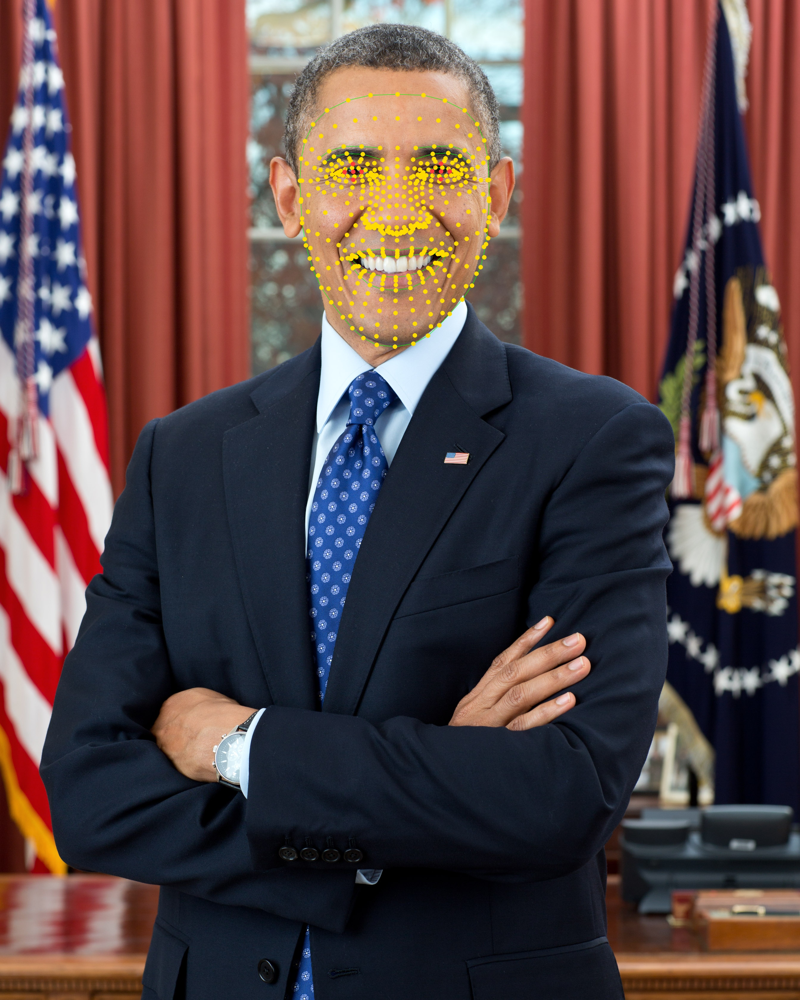

In [33]:
from IPython.display import display
from PIL import Image

display(Image.open("face_mesh_result.jpg"))

# إذا أردت الشبكة الكاملة 478 نقطة:

In [34]:
draw_mesh(
    output,
    result.landmarks,
    mode="full"
)

array([[[ 32,  34,  98],
        [ 30,  33,  94],
        [ 27,  30,  91],
        ...,
        [ 89,  94, 193],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 32,  34,  98],
        [ 29,  32,  93],
        [ 27,  30,  91],
        ...,
        [ 88,  93, 192],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 31,  33,  97],
        [ 29,  32,  93],
        [ 26,  29,  90],
        ...,
        [ 87,  92, 191],
        [ 90,  95, 194],
        [ 90,  95, 194]],

       ...,

       [[ 34,  74, 122],
        [ 34,  74, 122],
        [ 35,  75, 123],
        ...,
        [ 11,  50,  89],
        [ 15,  51,  91],
        [ 14,  49,  89]],

       [[ 33,  71, 119],
        [ 33,  71, 119],
        [ 34,  72, 120],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]],

       [[ 31,  67, 115],
        [ 31,  67, 115],
        [ 32,  68, 116],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]]

In [35]:
draw_mesh(
    output,
    result.landmarks,
    mode="points"
)

array([[[ 32,  34,  98],
        [ 30,  33,  94],
        [ 27,  30,  91],
        ...,
        [ 89,  94, 193],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 32,  34,  98],
        [ 29,  32,  93],
        [ 27,  30,  91],
        ...,
        [ 88,  93, 192],
        [ 91,  96, 195],
        [ 90,  95, 194]],

       [[ 31,  33,  97],
        [ 29,  32,  93],
        [ 26,  29,  90],
        ...,
        [ 87,  92, 191],
        [ 90,  95, 194],
        [ 90,  95, 194]],

       ...,

       [[ 34,  74, 122],
        [ 34,  74, 122],
        [ 35,  75, 123],
        ...,
        [ 11,  50,  89],
        [ 15,  51,  91],
        [ 14,  49,  89]],

       [[ 33,  71, 119],
        [ 33,  71, 119],
        [ 34,  72, 120],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]],

       [[ 31,  67, 115],
        [ 31,  67, 115],
        [ 32,  68, 116],
        ...,
        [ 10,  49,  88],
        [ 14,  50,  90],
        [ 13,  48,  88]]